# **Lab 5.2 Denoise & Deblur image with Autoencoder**

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
import torchvision.transforms as transforms
# increase vutils
import torchvision.utils as vutils
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader,Subset
from torch.utils.tensorboard import SummaryWriter
import copy

import numpy as np
import cv2
import os
import random
from skimage.util import random_noise
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
import torchvision.transforms as transforms
# increase vutils
import torchvision.utils as vutils
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader,Subset
from torch.utils.tensorboard import SummaryWriter
import copy

import numpy as np
import cv2
import os
import random
from skimage.util import random_noise
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm


ImportError: cannot import name 'sym_float' from 'torch' (unknown location)

## Data Preparation
Complete the class `CustomImageDataset()` that `__getitem__` return ***noisy blury*** image and ***ground truth*** image.
Please ensure that the final image is in RGBscale and has a size of 128x128.
The gaussian blur kernel size parameter should be random in the range [3,11]
and gaussian noise mean should be randoom in range [-50,50].

Parameters:
- image_paths: A list of paths to the images to be loaded.
- gauss_noise: A boolean flag to indicate if Gaussian noise should be added to the image.
- gauss_blur: A boolean flag to indicate if Gaussian blur should be applied to the image.
- resize: The size to which the image should be resized.
- p: Probability of applying certain transformations (like Gaussian noise or blur).

In [4]:
### START CODE HERE ###
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import torch
import random
import os

class CustomImageDataset(Dataset):
    def __init__(self, image_paths, salt_pepper_noise=False, gauss_blur=False, resize=128, p=0.02, transform=None):
        self.p = p
        self.resize = resize
        self.salt_pepper_noise = salt_pepper_noise
        self.gauss_blur = gauss_blur
        self.image_paths = image_paths
        self.transform = transform

        # PIL transformations first
        self.pil_transforms = transforms.Compose([
            transforms.Resize((resize, resize)),
            transforms.ToTensor(),
        ])
        
        # Additional transforms 
        self.aug_transforms = transforms.Compose([
            transforms.RandomApply([transforms.GaussianBlur(kernel_size=(3, 3))], p=self.p),
        ]) 

    def __len__(self):
        return len(self.image_paths)

    def add_salt_and_pepper_noise(self, tensor_img, prob=0.05):
        noisy_img = tensor_img.clone()
        salt_pepper = torch.rand_like(tensor_img)
        noisy_img[salt_pepper < prob / 2] = 0
        noisy_img[salt_pepper > 1 - prob / 2] = 1 
        return noisy_img
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        img = Image.open(img_path).convert("RGB")
        img = self.pil_transforms(img)
        gt_image = img.clone()

        if self.gauss_blur:
            img = self.aug_transforms(img)

        if self.salt_pepper_noise:
            img = self.add_salt_and_pepper_noise(img)

        return img, gt_image
### END CODE HERE ###

Use your [`CustomImageDataset()`](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#:~:text=transformed_dataset%20%3D%20FaceLandmarksDataset,3%3A%0A%20%20%20%20%20%20%20%20break)  to load the dataset in the cell below. Then, display the image from the first batch.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Noisy blury images (this reference use salt and pepper noise)<br>
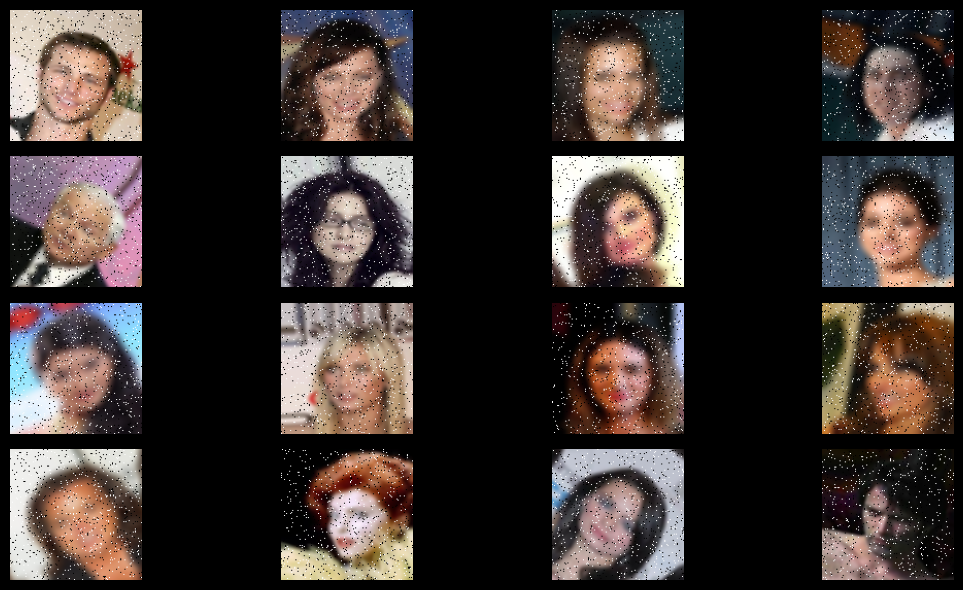

- Ground Truth images<br>
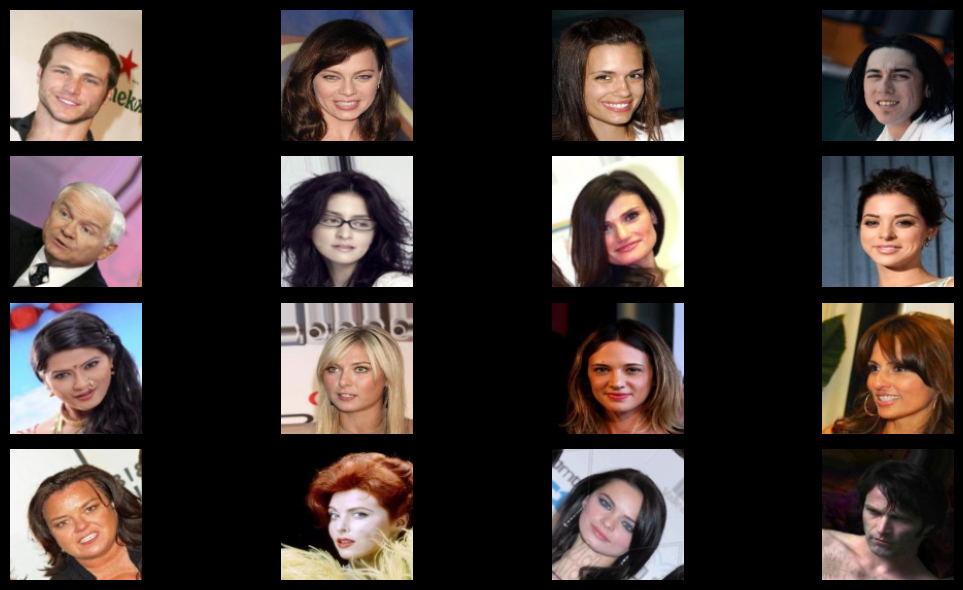

</details>

Complete the function below

In [2]:
### START CODE HERE ###
def imshow_grid(images, nrows=4, ncols=4):
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8, 8))
    # fig.subplots_adjust(wspace=0.1, hspace=0.4)
    fig.set_facecolor('black')
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            img = images[i].permute(1, 2, 0).numpy() 
            img = img * 255 
            ax.imshow(img.astype('uint8'))
        ax.axis('off')
    plt.subplots_adjust(left=0.05, right=1.5, bottom=0.02, top=0.95)
    plt.show()
### END CODE HERE ###

In [5]:
### START CODE HERE ###
import glob
data_dir = 'photo/5.2-photo'
image_paths = glob.glob(os.path.join(data_dir, "*.jpg"))

dataset = CustomImageDataset(image_paths, salt_pepper_noise=True, gauss_blur=True, resize=128, p=0.2)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)
### END CODE HERE ###

Noisy blury images (this reference use salt and pepper noise)


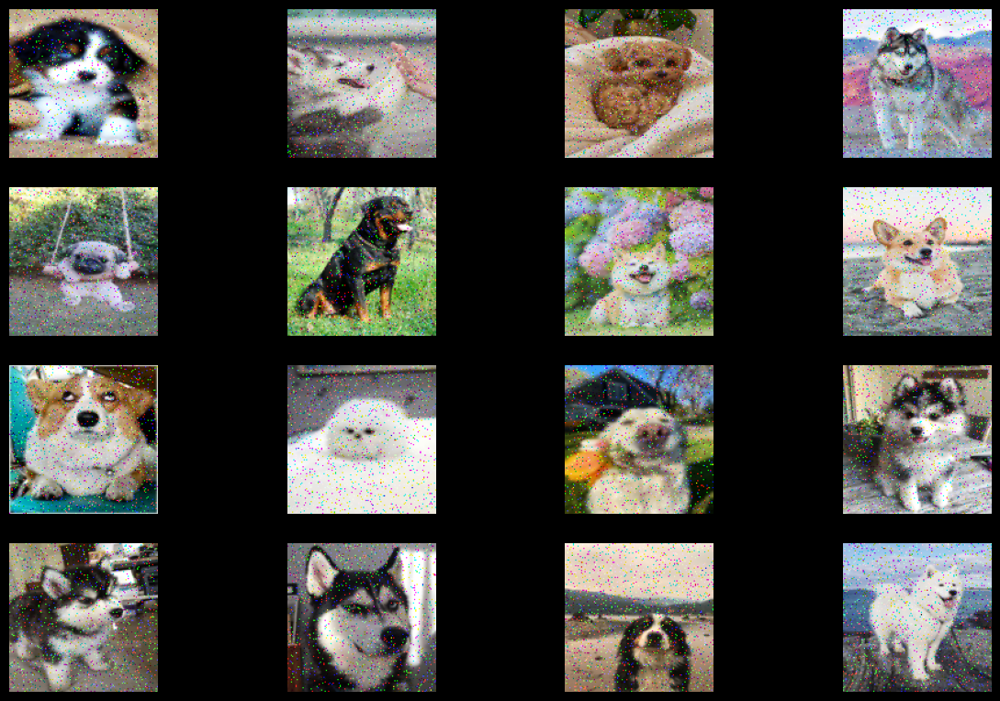

Ground Truth Images


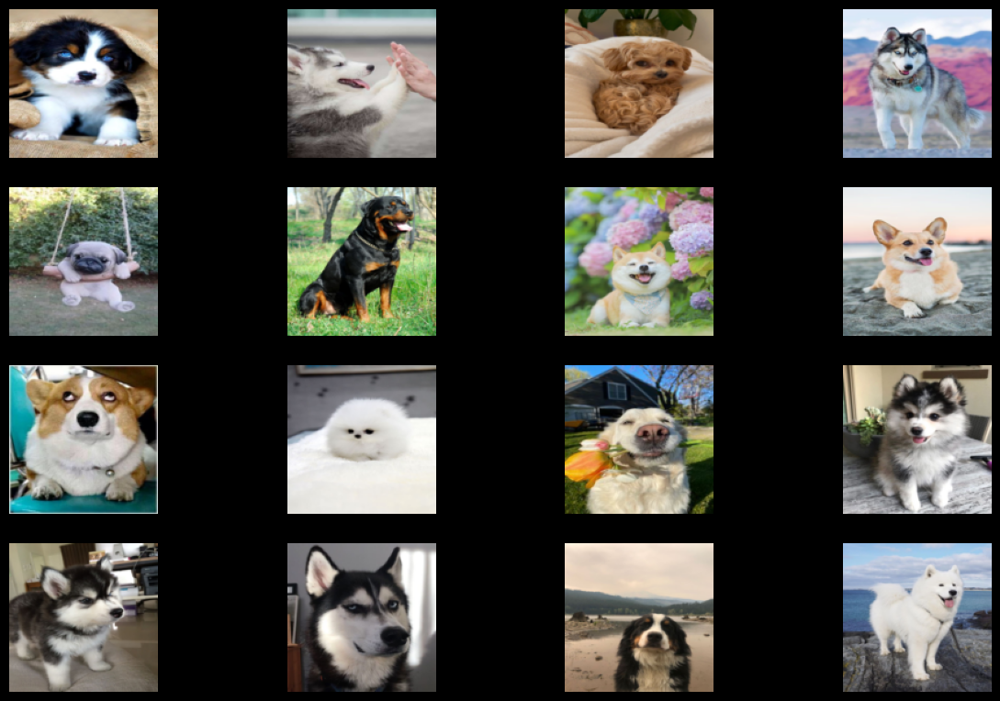

In [6]:
### START CODE HERE ###
batch, gt_img = next(iter(dataloader)) 
print("Noisy blury images (this reference use salt and pepper noise)")
imshow_grid(batch)
print("Ground Truth Images")
imshow_grid(gt_img)
### END CODE HERE ###

## Create Autoencoder model
You can design your own Autoencoder model based on the provided code below. However, please maintain the concept of 'Autoencoder'.
[Read more.](https://pytorch.org/tutorials/beginner/introyt/modelsyt_tutorial.html)

In [46]:
### START CODE HERE ###
class DownSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(DownSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.pool(x)
        return x

class UpSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(UpSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.upsample(x)
        return x

class Autoencoder(nn.Module):    
    def __init__(self):
        super().__init__()
        self.conv_in = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.down1 = DownSamplingBlock(64, 128, kernel_size=3, stride=1, padding=1)
        self.down2 = DownSamplingBlock(128, 256, kernel_size=3, stride=1, padding=1)
        
        self.bottleneck = nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1)

        # Dropout layer to prevent overfitting
        self.dropout = nn.Dropout(0.5)

        self.up1 = UpSamplingBlock(512, 256, kernel_size=3, stride=1, padding=1)
        self.up2 = UpSamplingBlock(256, 128, kernel_size=3, stride=1, padding=1)
        self.up3 = UpSamplingBlock(128, 64, kernel_size=3, stride=1, padding=1)
        self.conv = nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        x = self.conv_in(x)
        x = self.down1(x)
        x = self.down2(x)
        x = self.bottleneck(x)
        
        x = self.dropout(x)

        x = self.up1(x)
        x = self.up2(x)
        x = self.up3(x)
        x = self.conv(x)
        return x
### END CODE HERE ###

If you define your model class correcly, the cell below should run without any errors.

In [37]:
model = Autoencoder()
print(model)
out = model(batch[0].unsqueeze(dim=0).float())


Autoencoder(
  (conv_in): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (down1): DownSamplingBlock(
    (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down2): DownSamplingBlock(
    (conv): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (bottleneck): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (dropout): Dropout(p=0.5, inplace=False)
  (up1): UpSamplingBlock(
    (conv): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (upsample): Upsample(scale_factor=2.0, mode='bilinear')
  )
  (up2): UpSamplingBlock(
    (conv): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (upsample): Upsample(scal

## Train Autoencoder
Complete the `train()` function in the cell below. This function should evaluate the model at every epoch, log the ***training loss, test loss,test PSNR, test SSIM***. Additionally, it should save the model at the last epoch.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The log should resemble this, but not be identical

```
🤖Training on cuda
🚀Training Epoch [1/1]: 100%|██████████| 1313/1313 [01:45<00:00, 12.41batch/s, loss=0.0102] 
📄Testing: 100%|██████████| 563/563 [01:10<00:00,  7.95batch/s, loss=0.0106, psnr=16.7, ssim=0.348] 
Summary :
	Train	avg_loss: 0.017262999383663165
	Test	avg_loss: 0.010476540363861867 
                PSNR : 16.839487147468034 
                SSIM : 0.36090552368883694
...
```

</details>

Resource : [PyTorch Training loop](<https://pytorch.org/tutorials/beginner/introyt/trainingyt.html#:~:text=%3D0.9)-,The%20Training%20Loop,-Below%2C%20we%20have>), [PSNR & SSIM](https://ieeexplore.ieee.org/document/5596999)

In [47]:
### START CODE HERE ###
def train(model, opt, loss_fn, train_loader, test_loader, epochs=10, checkpoint_path=None, device='cpu'):
    print("🤖 Training on", device)
    model = model.to(device)
    
    train_losses = [] 
    test_losses = []   
    
    for epoch in range(epochs):
        model.train()
        epoch_train_loss = 0.0
        
        train_bar = tqdm(train_loader, desc=f'🚀 Training Epoch [{epoch+1}/{epochs}]', unit='batch')
        for images, gt in train_bar:
            images, gt = images.to(device), gt.to(device)
            opt.zero_grad()
            outputs = model(images)
            loss = loss_fn(outputs, gt)
            loss.backward()
            opt.step()

            epoch_train_loss += loss.item()  
            
        # Average training loss for this epoch
        avg_train_loss = epoch_train_loss / len(train_loader)
        train_losses.append(avg_train_loss) 
        print(f"Epoch [{epoch+1}/{epochs}] - Training Loss: {avg_train_loss:.4f}")

        model.eval()
        epoch_test_loss = 0.0
        
        test_bar = tqdm(test_loader, desc='📄 Testing', unit='batch')
        with torch.no_grad():  
            for images, gt in test_bar:
                images, gt = images.to(device), gt.to(device)
                outputs = model(images)
                loss = loss_fn(outputs, gt)
                epoch_test_loss += loss.item()
                
                print(f"Output shape: {outputs.shape}, GT shape: {gt.shape}")

        avg_test_loss = epoch_test_loss / len(test_loader)
        test_losses.append(avg_test_loss)
        print(f"Epoch [{epoch+1}/{epochs}] - Testing Loss: {avg_test_loss:.4f}")

        if checkpoint_path:
            torch.save(model.state_dict(), checkpoint_path)

    plt.figure(figsize=(10, 5))
    plt.plot(range(1, epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, epochs + 1), test_losses, label='Testing Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Testing Loss Over Epochs')
    plt.legend()
    plt.show()  
### END CODE HERE ###

Let's train your model.

In [42]:
### START CODE HERE ###
data_dir = 'photo/5.2-photo'
files = os.listdir(data_dir)
files = [os.path.join(data_dir, file) for file in files]

train_files, test_files = train_test_split(files, test_size=0.2)

train_dataset = CustomImageDataset(train_files, salt_pepper_noise=True, gauss_blur=True, resize=128, p=0.02)
test_dataset = CustomImageDataset(test_files)

trainloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
testloader = DataLoader(test_dataset, batch_size=16, shuffle=False)
### END CODE HERE ###

🤖 Training on cpu


🚀 Training Epoch [1/128]:   0%|          | 0/2 [00:00<?, ?batch/s]

🚀 Training Epoch [1/128]: 100%|██████████| 2/2 [00:09<00:00,  4.69s/batch]


Epoch [1/128] - Training Loss: 0.3066


📄 Testing: 100%|██████████| 1/1 [00:01<00:00,  1.13s/batch]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [1/128] - Testing Loss: 0.3584


🚀 Training Epoch [2/128]: 100%|██████████| 2/2 [00:11<00:00,  5.72s/batch]


Epoch [2/128] - Training Loss: 0.2890


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.22batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [2/128] - Testing Loss: 0.3311


🚀 Training Epoch [3/128]: 100%|██████████| 2/2 [00:08<00:00,  4.02s/batch]


Epoch [3/128] - Training Loss: 0.2575


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.42batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [3/128] - Testing Loss: 0.2598


🚀 Training Epoch [4/128]: 100%|██████████| 2/2 [00:07<00:00,  3.97s/batch]


Epoch [4/128] - Training Loss: 0.1685


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.49batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [4/128] - Testing Loss: 0.1151


🚀 Training Epoch [5/128]: 100%|██████████| 2/2 [00:08<00:00,  4.20s/batch]


Epoch [5/128] - Training Loss: 0.0677


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.30batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [5/128] - Testing Loss: 0.0774


🚀 Training Epoch [6/128]: 100%|██████████| 2/2 [00:08<00:00,  4.42s/batch]


Epoch [6/128] - Training Loss: 0.1019


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.22batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [6/128] - Testing Loss: 0.0525


🚀 Training Epoch [7/128]: 100%|██████████| 2/2 [00:08<00:00,  4.38s/batch]


Epoch [7/128] - Training Loss: 0.0493


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.13batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [7/128] - Testing Loss: 0.0867


🚀 Training Epoch [8/128]: 100%|██████████| 2/2 [00:09<00:00,  4.66s/batch]


Epoch [8/128] - Training Loss: 0.0614


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.39batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [8/128] - Testing Loss: 0.1081


🚀 Training Epoch [9/128]: 100%|██████████| 2/2 [00:08<00:00,  4.01s/batch]


Epoch [9/128] - Training Loss: 0.0698


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.40batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [9/128] - Testing Loss: 0.0917


🚀 Training Epoch [10/128]: 100%|██████████| 2/2 [00:08<00:00,  4.28s/batch]


Epoch [10/128] - Training Loss: 0.0561


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.31batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [10/128] - Testing Loss: 0.0580


🚀 Training Epoch [11/128]: 100%|██████████| 2/2 [00:07<00:00,  3.98s/batch]


Epoch [11/128] - Training Loss: 0.0450


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.41batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [11/128] - Testing Loss: 0.0476


🚀 Training Epoch [12/128]: 100%|██████████| 2/2 [00:07<00:00,  3.88s/batch]


Epoch [12/128] - Training Loss: 0.0522


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.42batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [12/128] - Testing Loss: 0.0478


🚀 Training Epoch [13/128]: 100%|██████████| 2/2 [00:07<00:00,  3.67s/batch]


Epoch [13/128] - Training Loss: 0.0452


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.46batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [13/128] - Testing Loss: 0.0545


🚀 Training Epoch [14/128]: 100%|██████████| 2/2 [00:07<00:00,  3.73s/batch]


Epoch [14/128] - Training Loss: 0.0417


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.33batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [14/128] - Testing Loss: 0.0677


🚀 Training Epoch [15/128]: 100%|██████████| 2/2 [00:07<00:00,  3.67s/batch]


Epoch [15/128] - Training Loss: 0.0453


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.38batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [15/128] - Testing Loss: 0.0680


🚀 Training Epoch [16/128]: 100%|██████████| 2/2 [00:07<00:00,  3.66s/batch]


Epoch [16/128] - Training Loss: 0.0451


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.28batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [16/128] - Testing Loss: 0.0549


🚀 Training Epoch [17/128]: 100%|██████████| 2/2 [00:07<00:00,  3.75s/batch]


Epoch [17/128] - Training Loss: 0.0380


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.38batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [17/128] - Testing Loss: 0.0453


🚀 Training Epoch [18/128]: 100%|██████████| 2/2 [00:07<00:00,  3.69s/batch]


Epoch [18/128] - Training Loss: 0.0408


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.22batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [18/128] - Testing Loss: 0.0440


🚀 Training Epoch [19/128]: 100%|██████████| 2/2 [00:07<00:00,  3.69s/batch]


Epoch [19/128] - Training Loss: 0.0385


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.38batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [19/128] - Testing Loss: 0.0468


🚀 Training Epoch [20/128]: 100%|██████████| 2/2 [00:08<00:00,  4.17s/batch]


Epoch [20/128] - Training Loss: 0.0375


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.21batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [20/128] - Testing Loss: 0.0516


🚀 Training Epoch [21/128]: 100%|██████████| 2/2 [00:08<00:00,  4.03s/batch]


Epoch [21/128] - Training Loss: 0.0374


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.40batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [21/128] - Testing Loss: 0.0490


🚀 Training Epoch [22/128]: 100%|██████████| 2/2 [00:08<00:00,  4.29s/batch]


Epoch [22/128] - Training Loss: 0.0351


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.38batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [22/128] - Testing Loss: 0.0436


🚀 Training Epoch [23/128]: 100%|██████████| 2/2 [00:07<00:00,  3.95s/batch]


Epoch [23/128] - Training Loss: 0.0336


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.44batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [23/128] - Testing Loss: 0.0416


🚀 Training Epoch [24/128]: 100%|██████████| 2/2 [00:07<00:00,  3.88s/batch]


Epoch [24/128] - Training Loss: 0.0330


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.43batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [24/128] - Testing Loss: 0.0417


🚀 Training Epoch [25/128]: 100%|██████████| 2/2 [00:07<00:00,  3.76s/batch]


Epoch [25/128] - Training Loss: 0.0330


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.35batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [25/128] - Testing Loss: 0.0431


🚀 Training Epoch [26/128]: 100%|██████████| 2/2 [00:07<00:00,  3.77s/batch]


Epoch [26/128] - Training Loss: 0.0323


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.31batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [26/128] - Testing Loss: 0.0400


🚀 Training Epoch [27/128]: 100%|██████████| 2/2 [00:07<00:00,  3.78s/batch]


Epoch [27/128] - Training Loss: 0.0314


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.43batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [27/128] - Testing Loss: 0.0387


🚀 Training Epoch [28/128]: 100%|██████████| 2/2 [00:07<00:00,  3.79s/batch]


Epoch [28/128] - Training Loss: 0.0308


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.38batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [28/128] - Testing Loss: 0.0391


🚀 Training Epoch [29/128]: 100%|██████████| 2/2 [00:07<00:00,  3.72s/batch]


Epoch [29/128] - Training Loss: 0.0297


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.40batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [29/128] - Testing Loss: 0.0392


🚀 Training Epoch [30/128]: 100%|██████████| 2/2 [00:07<00:00,  3.81s/batch]


Epoch [30/128] - Training Loss: 0.0294


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.36batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [30/128] - Testing Loss: 0.0368


🚀 Training Epoch [31/128]: 100%|██████████| 2/2 [00:07<00:00,  3.72s/batch]


Epoch [31/128] - Training Loss: 0.0289


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.42batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [31/128] - Testing Loss: 0.0360


🚀 Training Epoch [32/128]: 100%|██████████| 2/2 [00:07<00:00,  3.84s/batch]


Epoch [32/128] - Training Loss: 0.0280


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.46batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [32/128] - Testing Loss: 0.0365


🚀 Training Epoch [33/128]: 100%|██████████| 2/2 [00:07<00:00,  3.79s/batch]


Epoch [33/128] - Training Loss: 0.0282


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.43batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [33/128] - Testing Loss: 0.0356


🚀 Training Epoch [34/128]: 100%|██████████| 2/2 [00:07<00:00,  3.81s/batch]


Epoch [34/128] - Training Loss: 0.0281


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.44batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [34/128] - Testing Loss: 0.0351


🚀 Training Epoch [35/128]: 100%|██████████| 2/2 [00:07<00:00,  3.74s/batch]


Epoch [35/128] - Training Loss: 0.0266


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.41batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [35/128] - Testing Loss: 0.0358


🚀 Training Epoch [36/128]: 100%|██████████| 2/2 [00:07<00:00,  3.81s/batch]


Epoch [36/128] - Training Loss: 0.0265


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.41batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [36/128] - Testing Loss: 0.0346


🚀 Training Epoch [37/128]: 100%|██████████| 2/2 [00:07<00:00,  3.74s/batch]


Epoch [37/128] - Training Loss: 0.0263


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.36batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [37/128] - Testing Loss: 0.0334


🚀 Training Epoch [38/128]: 100%|██████████| 2/2 [00:07<00:00,  3.85s/batch]


Epoch [38/128] - Training Loss: 0.0241


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.40batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [38/128] - Testing Loss: 0.0343


🚀 Training Epoch [39/128]: 100%|██████████| 2/2 [00:07<00:00,  3.77s/batch]


Epoch [39/128] - Training Loss: 0.0241


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.46batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [39/128] - Testing Loss: 0.0338


🚀 Training Epoch [40/128]: 100%|██████████| 2/2 [00:07<00:00,  3.83s/batch]


Epoch [40/128] - Training Loss: 0.0234


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.37batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [40/128] - Testing Loss: 0.0331


🚀 Training Epoch [41/128]: 100%|██████████| 2/2 [00:07<00:00,  3.69s/batch]


Epoch [41/128] - Training Loss: 0.0235


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.40batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [41/128] - Testing Loss: 0.0334


🚀 Training Epoch [42/128]: 100%|██████████| 2/2 [00:07<00:00,  3.71s/batch]


Epoch [42/128] - Training Loss: 0.0231


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.18batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [42/128] - Testing Loss: 0.0315


🚀 Training Epoch [43/128]: 100%|██████████| 2/2 [00:09<00:00,  4.80s/batch]


Epoch [43/128] - Training Loss: 0.0229


📄 Testing: 100%|██████████| 1/1 [00:01<00:00,  1.10s/batch]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [43/128] - Testing Loss: 0.0332


🚀 Training Epoch [44/128]: 100%|██████████| 2/2 [00:09<00:00,  4.65s/batch]


Epoch [44/128] - Training Loss: 0.0228


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.14batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [44/128] - Testing Loss: 0.0303


🚀 Training Epoch [45/128]: 100%|██████████| 2/2 [00:08<00:00,  4.34s/batch]


Epoch [45/128] - Training Loss: 0.0226


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.23batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [45/128] - Testing Loss: 0.0328


🚀 Training Epoch [46/128]: 100%|██████████| 2/2 [00:08<00:00,  4.14s/batch]


Epoch [46/128] - Training Loss: 0.0222


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.19batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [46/128] - Testing Loss: 0.0300


🚀 Training Epoch [47/128]: 100%|██████████| 2/2 [00:08<00:00,  4.19s/batch]


Epoch [47/128] - Training Loss: 0.0215


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.15batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [47/128] - Testing Loss: 0.0330


🚀 Training Epoch [48/128]: 100%|██████████| 2/2 [00:08<00:00,  4.16s/batch]


Epoch [48/128] - Training Loss: 0.0213


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.24batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [48/128] - Testing Loss: 0.0308


🚀 Training Epoch [49/128]: 100%|██████████| 2/2 [00:08<00:00,  4.23s/batch]


Epoch [49/128] - Training Loss: 0.0207


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.25batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [49/128] - Testing Loss: 0.0298


🚀 Training Epoch [50/128]: 100%|██████████| 2/2 [00:08<00:00,  4.22s/batch]


Epoch [50/128] - Training Loss: 0.0207


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.33batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [50/128] - Testing Loss: 0.0324


🚀 Training Epoch [51/128]: 100%|██████████| 2/2 [00:08<00:00,  4.14s/batch]


Epoch [51/128] - Training Loss: 0.0201


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.20batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [51/128] - Testing Loss: 0.0290


🚀 Training Epoch [52/128]: 100%|██████████| 2/2 [00:08<00:00,  4.19s/batch]


Epoch [52/128] - Training Loss: 0.0200


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.28batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [52/128] - Testing Loss: 0.0321


🚀 Training Epoch [53/128]: 100%|██████████| 2/2 [00:10<00:00,  5.05s/batch]


Epoch [53/128] - Training Loss: 0.0192


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.11batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [53/128] - Testing Loss: 0.0278


🚀 Training Epoch [54/128]: 100%|██████████| 2/2 [00:09<00:00,  4.88s/batch]


Epoch [54/128] - Training Loss: 0.0199


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.14batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [54/128] - Testing Loss: 0.0313


🚀 Training Epoch [55/128]: 100%|██████████| 2/2 [00:08<00:00,  4.14s/batch]


Epoch [55/128] - Training Loss: 0.0191


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.36batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [55/128] - Testing Loss: 0.0279


🚀 Training Epoch [56/128]: 100%|██████████| 2/2 [00:07<00:00,  3.70s/batch]


Epoch [56/128] - Training Loss: 0.0190


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.47batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [56/128] - Testing Loss: 0.0288


🚀 Training Epoch [57/128]: 100%|██████████| 2/2 [00:07<00:00,  3.66s/batch]


Epoch [57/128] - Training Loss: 0.0184


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.47batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [57/128] - Testing Loss: 0.0277


🚀 Training Epoch [58/128]: 100%|██████████| 2/2 [00:07<00:00,  3.61s/batch]


Epoch [58/128] - Training Loss: 0.0191


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.41batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [58/128] - Testing Loss: 0.0281


🚀 Training Epoch [59/128]: 100%|██████████| 2/2 [00:07<00:00,  3.67s/batch]


Epoch [59/128] - Training Loss: 0.0183


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.53batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [59/128] - Testing Loss: 0.0284


🚀 Training Epoch [60/128]: 100%|██████████| 2/2 [00:07<00:00,  3.65s/batch]


Epoch [60/128] - Training Loss: 0.0178


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.20batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [60/128] - Testing Loss: 0.0267


🚀 Training Epoch [61/128]: 100%|██████████| 2/2 [00:07<00:00,  3.70s/batch]


Epoch [61/128] - Training Loss: 0.0177


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.50batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [61/128] - Testing Loss: 0.0266


🚀 Training Epoch [62/128]: 100%|██████████| 2/2 [00:07<00:00,  3.71s/batch]


Epoch [62/128] - Training Loss: 0.0177


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.36batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [62/128] - Testing Loss: 0.0273


🚀 Training Epoch [63/128]: 100%|██████████| 2/2 [00:07<00:00,  3.64s/batch]


Epoch [63/128] - Training Loss: 0.0171


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.46batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [63/128] - Testing Loss: 0.0253


🚀 Training Epoch [64/128]: 100%|██████████| 2/2 [00:08<00:00,  4.02s/batch]


Epoch [64/128] - Training Loss: 0.0167


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.07batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [64/128] - Testing Loss: 0.0264


🚀 Training Epoch [65/128]: 100%|██████████| 2/2 [00:08<00:00,  4.36s/batch]


Epoch [65/128] - Training Loss: 0.0165


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.18batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [65/128] - Testing Loss: 0.0244


🚀 Training Epoch [66/128]: 100%|██████████| 2/2 [00:08<00:00,  4.20s/batch]


Epoch [66/128] - Training Loss: 0.0166


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.20batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [66/128] - Testing Loss: 0.0264


🚀 Training Epoch [67/128]: 100%|██████████| 2/2 [00:08<00:00,  4.22s/batch]


Epoch [67/128] - Training Loss: 0.0157


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.18batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [67/128] - Testing Loss: 0.0234


🚀 Training Epoch [68/128]: 100%|██████████| 2/2 [00:08<00:00,  4.22s/batch]


Epoch [68/128] - Training Loss: 0.0157


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.22batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [68/128] - Testing Loss: 0.0253


🚀 Training Epoch [69/128]: 100%|██████████| 2/2 [00:08<00:00,  4.27s/batch]


Epoch [69/128] - Training Loss: 0.0159


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.28batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [69/128] - Testing Loss: 0.0227


🚀 Training Epoch [70/128]: 100%|██████████| 2/2 [00:08<00:00,  4.20s/batch]


Epoch [70/128] - Training Loss: 0.0154


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.26batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [70/128] - Testing Loss: 0.0230


🚀 Training Epoch [71/128]: 100%|██████████| 2/2 [00:08<00:00,  4.21s/batch]


Epoch [71/128] - Training Loss: 0.0147


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.21batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [71/128] - Testing Loss: 0.0222


🚀 Training Epoch [72/128]: 100%|██████████| 2/2 [00:08<00:00,  4.31s/batch]


Epoch [72/128] - Training Loss: 0.0148


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.27batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [72/128] - Testing Loss: 0.0218


🚀 Training Epoch [73/128]: 100%|██████████| 2/2 [00:08<00:00,  4.17s/batch]


Epoch [73/128] - Training Loss: 0.0144


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.23batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [73/128] - Testing Loss: 0.0218


🚀 Training Epoch [74/128]: 100%|██████████| 2/2 [00:08<00:00,  4.14s/batch]


Epoch [74/128] - Training Loss: 0.0140


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.25batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [74/128] - Testing Loss: 0.0204


🚀 Training Epoch [75/128]: 100%|██████████| 2/2 [00:08<00:00,  4.24s/batch]


Epoch [75/128] - Training Loss: 0.0149


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.26batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [75/128] - Testing Loss: 0.0207


🚀 Training Epoch [76/128]: 100%|██████████| 2/2 [00:08<00:00,  4.15s/batch]


Epoch [76/128] - Training Loss: 0.0138


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.34batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [76/128] - Testing Loss: 0.0226


🚀 Training Epoch [77/128]: 100%|██████████| 2/2 [00:08<00:00,  4.09s/batch]


Epoch [77/128] - Training Loss: 0.0136


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.21batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [77/128] - Testing Loss: 0.0198


🚀 Training Epoch [78/128]: 100%|██████████| 2/2 [00:08<00:00,  4.15s/batch]


Epoch [78/128] - Training Loss: 0.0141


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.14batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [78/128] - Testing Loss: 0.0220


🚀 Training Epoch [79/128]: 100%|██████████| 2/2 [00:09<00:00,  4.53s/batch]


Epoch [79/128] - Training Loss: 0.0141


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.13batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [79/128] - Testing Loss: 0.0198


🚀 Training Epoch [80/128]: 100%|██████████| 2/2 [00:08<00:00,  4.11s/batch]


Epoch [80/128] - Training Loss: 0.0134


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.21batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [80/128] - Testing Loss: 0.0213


🚀 Training Epoch [81/128]: 100%|██████████| 2/2 [00:08<00:00,  4.18s/batch]


Epoch [81/128] - Training Loss: 0.0134


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.26batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [81/128] - Testing Loss: 0.0196


🚀 Training Epoch [82/128]: 100%|██████████| 2/2 [00:08<00:00,  4.28s/batch]


Epoch [82/128] - Training Loss: 0.0138


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.14batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [82/128] - Testing Loss: 0.0207


🚀 Training Epoch [83/128]: 100%|██████████| 2/2 [00:08<00:00,  4.28s/batch]


Epoch [83/128] - Training Loss: 0.0135


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.09batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [83/128] - Testing Loss: 0.0196


🚀 Training Epoch [84/128]: 100%|██████████| 2/2 [00:08<00:00,  4.20s/batch]


Epoch [84/128] - Training Loss: 0.0136


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.25batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [84/128] - Testing Loss: 0.0196


🚀 Training Epoch [85/128]: 100%|██████████| 2/2 [00:08<00:00,  4.08s/batch]


Epoch [85/128] - Training Loss: 0.0132


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.32batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [85/128] - Testing Loss: 0.0195


🚀 Training Epoch [86/128]: 100%|██████████| 2/2 [00:08<00:00,  4.17s/batch]


Epoch [86/128] - Training Loss: 0.0134


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.21batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [86/128] - Testing Loss: 0.0190


🚀 Training Epoch [87/128]: 100%|██████████| 2/2 [00:08<00:00,  4.14s/batch]


Epoch [87/128] - Training Loss: 0.0128


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.22batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [87/128] - Testing Loss: 0.0195


🚀 Training Epoch [88/128]: 100%|██████████| 2/2 [00:08<00:00,  4.32s/batch]


Epoch [88/128] - Training Loss: 0.0129


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.24batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [88/128] - Testing Loss: 0.0191


🚀 Training Epoch [89/128]: 100%|██████████| 2/2 [00:08<00:00,  4.11s/batch]


Epoch [89/128] - Training Loss: 0.0129


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.29batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [89/128] - Testing Loss: 0.0190


🚀 Training Epoch [90/128]: 100%|██████████| 2/2 [00:08<00:00,  4.17s/batch]


Epoch [90/128] - Training Loss: 0.0129


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.28batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [90/128] - Testing Loss: 0.0191


🚀 Training Epoch [91/128]: 100%|██████████| 2/2 [00:08<00:00,  4.05s/batch]


Epoch [91/128] - Training Loss: 0.0126


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.25batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [91/128] - Testing Loss: 0.0192


🚀 Training Epoch [92/128]: 100%|██████████| 2/2 [00:08<00:00,  4.25s/batch]


Epoch [92/128] - Training Loss: 0.0127


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.24batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [92/128] - Testing Loss: 0.0187


🚀 Training Epoch [93/128]: 100%|██████████| 2/2 [00:08<00:00,  4.36s/batch]


Epoch [93/128] - Training Loss: 0.0124


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.28batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [93/128] - Testing Loss: 0.0201


🚀 Training Epoch [94/128]: 100%|██████████| 2/2 [00:08<00:00,  4.24s/batch]


Epoch [94/128] - Training Loss: 0.0126


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.26batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [94/128] - Testing Loss: 0.0181


🚀 Training Epoch [95/128]: 100%|██████████| 2/2 [00:08<00:00,  4.16s/batch]


Epoch [95/128] - Training Loss: 0.0125


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.26batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [95/128] - Testing Loss: 0.0195


🚀 Training Epoch [96/128]: 100%|██████████| 2/2 [00:08<00:00,  4.23s/batch]


Epoch [96/128] - Training Loss: 0.0128


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.18batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [96/128] - Testing Loss: 0.0182


🚀 Training Epoch [97/128]: 100%|██████████| 2/2 [00:08<00:00,  4.16s/batch]


Epoch [97/128] - Training Loss: 0.0124


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.29batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [97/128] - Testing Loss: 0.0186


🚀 Training Epoch [98/128]: 100%|██████████| 2/2 [00:08<00:00,  4.15s/batch]


Epoch [98/128] - Training Loss: 0.0118


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.30batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [98/128] - Testing Loss: 0.0178


🚀 Training Epoch [99/128]: 100%|██████████| 2/2 [00:08<00:00,  4.22s/batch]


Epoch [99/128] - Training Loss: 0.0121


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.24batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [99/128] - Testing Loss: 0.0187


🚀 Training Epoch [100/128]: 100%|██████████| 2/2 [00:08<00:00,  4.34s/batch]


Epoch [100/128] - Training Loss: 0.0119


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.29batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [100/128] - Testing Loss: 0.0180


🚀 Training Epoch [101/128]: 100%|██████████| 2/2 [00:08<00:00,  4.13s/batch]


Epoch [101/128] - Training Loss: 0.0123


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.19batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [101/128] - Testing Loss: 0.0178


🚀 Training Epoch [102/128]: 100%|██████████| 2/2 [00:08<00:00,  4.16s/batch]


Epoch [102/128] - Training Loss: 0.0126


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.36batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [102/128] - Testing Loss: 0.0188


🚀 Training Epoch [103/128]: 100%|██████████| 2/2 [00:08<00:00,  4.12s/batch]


Epoch [103/128] - Training Loss: 0.0122


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.21batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [103/128] - Testing Loss: 0.0175


🚀 Training Epoch [104/128]: 100%|██████████| 2/2 [00:08<00:00,  4.16s/batch]


Epoch [104/128] - Training Loss: 0.0121


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.22batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [104/128] - Testing Loss: 0.0181


🚀 Training Epoch [105/128]: 100%|██████████| 2/2 [00:08<00:00,  4.16s/batch]


Epoch [105/128] - Training Loss: 0.0121


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.23batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [105/128] - Testing Loss: 0.0178


🚀 Training Epoch [106/128]: 100%|██████████| 2/2 [00:08<00:00,  4.21s/batch]


Epoch [106/128] - Training Loss: 0.0117


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.29batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [106/128] - Testing Loss: 0.0174


🚀 Training Epoch [107/128]: 100%|██████████| 2/2 [00:08<00:00,  4.23s/batch]


Epoch [107/128] - Training Loss: 0.0122


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.27batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [107/128] - Testing Loss: 0.0173


🚀 Training Epoch [108/128]: 100%|██████████| 2/2 [00:08<00:00,  4.19s/batch]


Epoch [108/128] - Training Loss: 0.0116


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.35batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [108/128] - Testing Loss: 0.0184


🚀 Training Epoch [109/128]: 100%|██████████| 2/2 [00:08<00:00,  4.27s/batch]


Epoch [109/128] - Training Loss: 0.0125


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.23batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [109/128] - Testing Loss: 0.0178


🚀 Training Epoch [110/128]: 100%|██████████| 2/2 [00:08<00:00,  4.21s/batch]


Epoch [110/128] - Training Loss: 0.0118


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.19batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [110/128] - Testing Loss: 0.0170


🚀 Training Epoch [111/128]: 100%|██████████| 2/2 [00:08<00:00,  4.21s/batch]


Epoch [111/128] - Training Loss: 0.0120


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.20batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [111/128] - Testing Loss: 0.0177


🚀 Training Epoch [112/128]: 100%|██████████| 2/2 [00:08<00:00,  4.13s/batch]


Epoch [112/128] - Training Loss: 0.0120


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.17batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [112/128] - Testing Loss: 0.0178


🚀 Training Epoch [113/128]: 100%|██████████| 2/2 [00:08<00:00,  4.27s/batch]


Epoch [113/128] - Training Loss: 0.0117


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.27batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [113/128] - Testing Loss: 0.0170


🚀 Training Epoch [114/128]: 100%|██████████| 2/2 [00:08<00:00,  4.13s/batch]


Epoch [114/128] - Training Loss: 0.0122


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.25batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [114/128] - Testing Loss: 0.0176


🚀 Training Epoch [115/128]: 100%|██████████| 2/2 [00:08<00:00,  4.06s/batch]


Epoch [115/128] - Training Loss: 0.0123


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.39batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [115/128] - Testing Loss: 0.0181


🚀 Training Epoch [116/128]: 100%|██████████| 2/2 [00:07<00:00,  3.72s/batch]


Epoch [116/128] - Training Loss: 0.0118


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.30batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [116/128] - Testing Loss: 0.0169


🚀 Training Epoch [117/128]: 100%|██████████| 2/2 [00:07<00:00,  3.68s/batch]


Epoch [117/128] - Training Loss: 0.0118


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.45batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [117/128] - Testing Loss: 0.0182


🚀 Training Epoch [118/128]: 100%|██████████| 2/2 [00:07<00:00,  3.69s/batch]


Epoch [118/128] - Training Loss: 0.0119


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.36batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [118/128] - Testing Loss: 0.0168


🚀 Training Epoch [119/128]: 100%|██████████| 2/2 [00:07<00:00,  3.70s/batch]


Epoch [119/128] - Training Loss: 0.0116


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.38batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [119/128] - Testing Loss: 0.0177


🚀 Training Epoch [120/128]: 100%|██████████| 2/2 [00:07<00:00,  3.93s/batch]


Epoch [120/128] - Training Loss: 0.0115


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.43batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [120/128] - Testing Loss: 0.0167


🚀 Training Epoch [121/128]: 100%|██████████| 2/2 [00:07<00:00,  3.64s/batch]


Epoch [121/128] - Training Loss: 0.0119


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.44batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [121/128] - Testing Loss: 0.0170


🚀 Training Epoch [122/128]: 100%|██████████| 2/2 [00:07<00:00,  3.67s/batch]


Epoch [122/128] - Training Loss: 0.0114


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.32batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [122/128] - Testing Loss: 0.0185


🚀 Training Epoch [123/128]: 100%|██████████| 2/2 [00:07<00:00,  3.76s/batch]


Epoch [123/128] - Training Loss: 0.0117


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.36batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [123/128] - Testing Loss: 0.0167


🚀 Training Epoch [124/128]: 100%|██████████| 2/2 [00:07<00:00,  3.69s/batch]


Epoch [124/128] - Training Loss: 0.0115


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.44batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [124/128] - Testing Loss: 0.0189


🚀 Training Epoch [125/128]: 100%|██████████| 2/2 [00:07<00:00,  3.67s/batch]


Epoch [125/128] - Training Loss: 0.0123


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.45batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [125/128] - Testing Loss: 0.0170


🚀 Training Epoch [126/128]: 100%|██████████| 2/2 [00:07<00:00,  3.69s/batch]


Epoch [126/128] - Training Loss: 0.0120


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.42batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [126/128] - Testing Loss: 0.0188


🚀 Training Epoch [127/128]: 100%|██████████| 2/2 [00:07<00:00,  3.63s/batch]


Epoch [127/128] - Training Loss: 0.0120


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.55batch/s]


Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [127/128] - Testing Loss: 0.0165


🚀 Training Epoch [128/128]: 100%|██████████| 2/2 [00:07<00:00,  3.67s/batch]


Epoch [128/128] - Training Loss: 0.0114


📄 Testing: 100%|██████████| 1/1 [00:00<00:00,  1.46batch/s]

Output shape: torch.Size([7, 3, 128, 128]), GT shape: torch.Size([7, 3, 128, 128])
Epoch [128/128] - Testing Loss: 0.0183


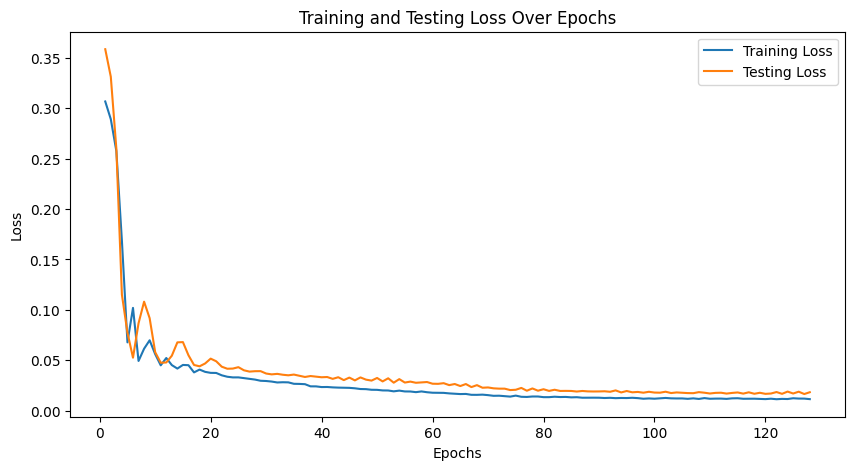

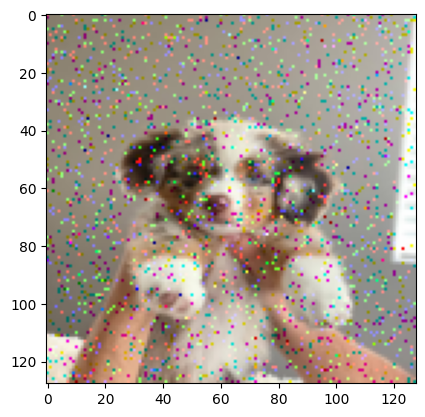

In [51]:
### START CODE HERE ###
from torch.optim.lr_scheduler import StepLR
model = Autoencoder()
opt = optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# reduce the learning rate over time
scheduler = StepLR(opt, step_size=5, gamma=0.5)

train(model, opt, loss_fn, trainloader, testloader, epochs=128, device='cuda' if torch.cuda.is_available() else 'cpu')
images, gt = next(iter(trainloader))
plt.imshow(images[0].permute(1, 2, 0))
plt.show()
### END CODE HERE ###

Let's use your trained model.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Input images<br>
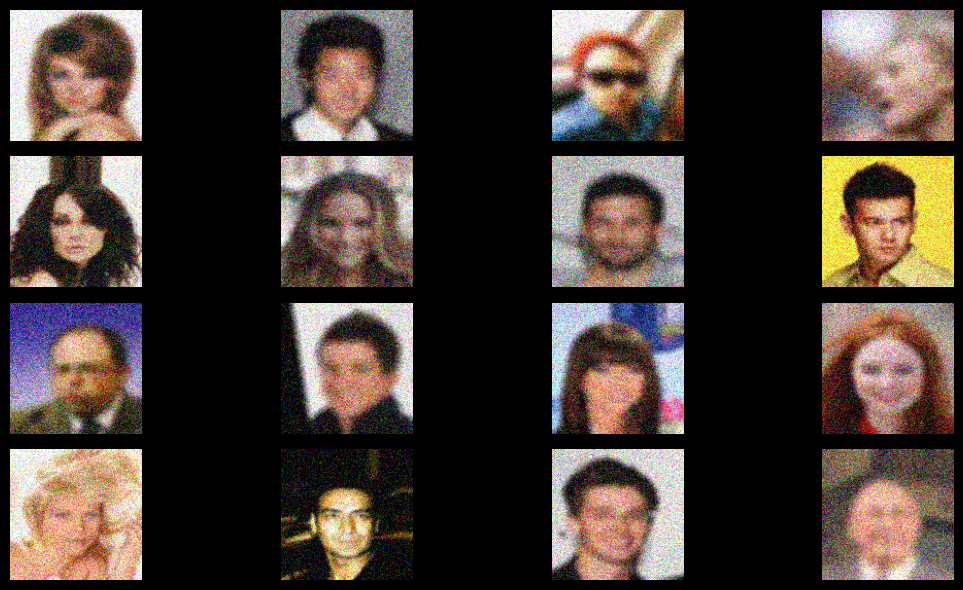

- Output images<br>
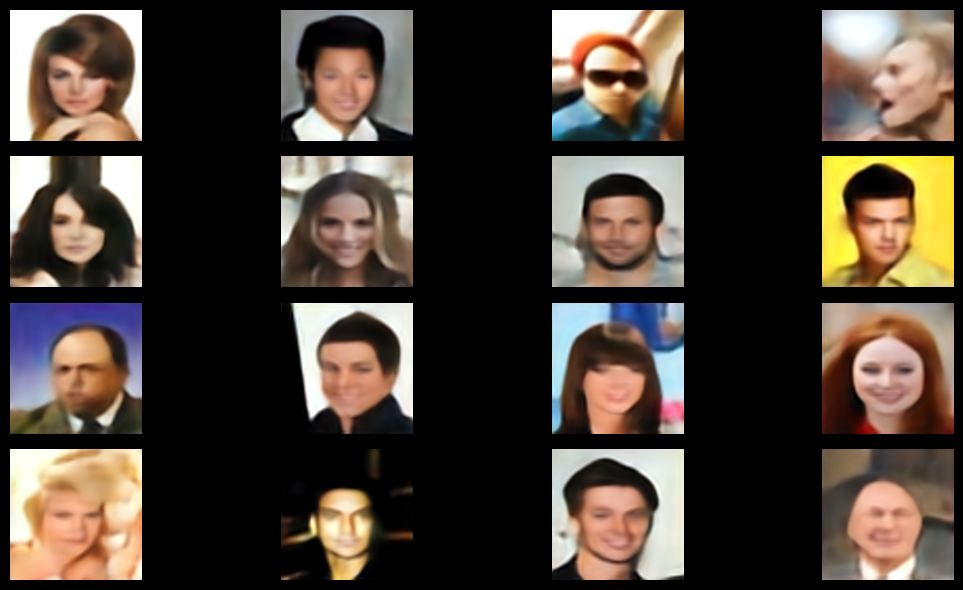

- Ground Truth images<br>
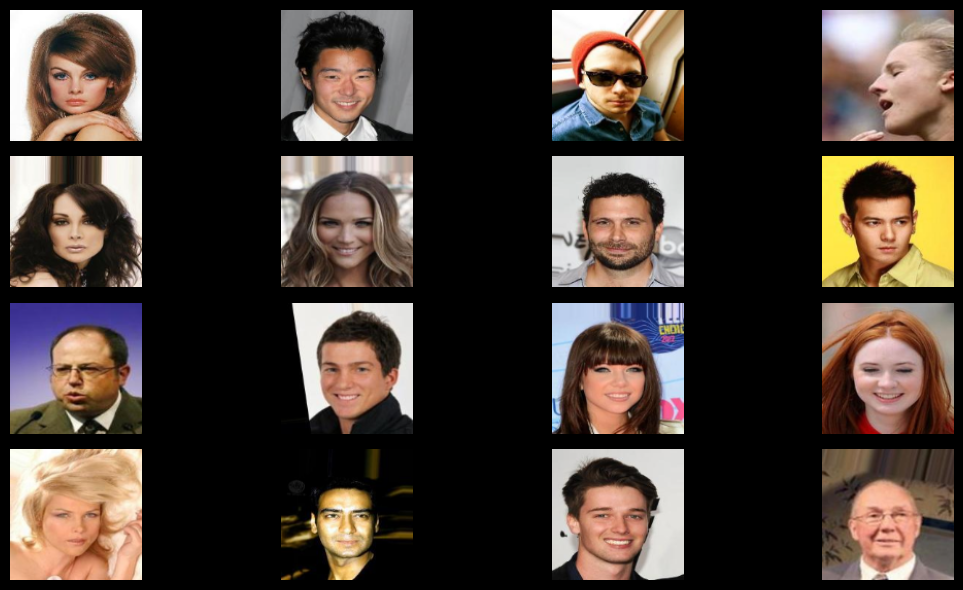

</details>

16
Output min without Sigmoid: 0.011547804810106754
Output max without Sigmoid: 1.0978853702545166
Output min: 0.011547804810106754
Output max: 1.0
Output values: [[[0.301858   0.37947863 0.41790324 ... 0.6686695  0.59973276 0.5698236 ]
  [0.4292582  0.4320195  0.45499533 ... 0.7079253  0.6585615  0.6439514 ]
  [0.45786187 0.45744306 0.46926376 ... 0.7123849  0.6874634  0.6946629 ]
  ...
  [0.7888855  0.8166965  0.8103308  ... 0.59673065 0.58339655 0.4982727 ]
  [0.71100354 0.75257194 0.7584549  ... 0.5811326  0.5595886  0.44554606]
  [0.56110954 0.65289885 0.71003777 ... 0.52752423 0.49155286 0.34414968]]

 [[0.33562243 0.3782537  0.41498506 ... 0.6038801  0.5267452  0.47709408]
  [0.39947993 0.43125653 0.44932958 ... 0.6966093  0.668492   0.60226053]
  [0.42237285 0.44931293 0.45397386 ... 0.6753917  0.66860986 0.6496551 ]
  ...
  [0.7718005  0.829275   0.79582864 ... 0.5392985  0.53758323 0.4727684 ]
  [0.71953964 0.80231225 0.77631575 ... 0.5351425  0.5213015  0.4083512 ]
  [0.5315

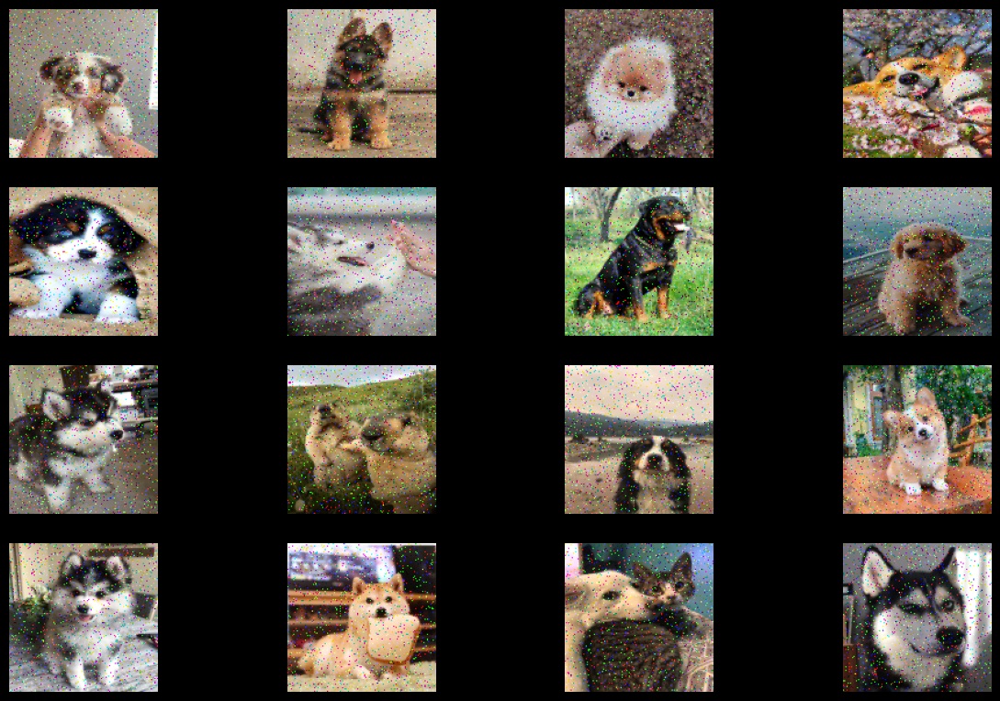

Output Images (Reconstructed):


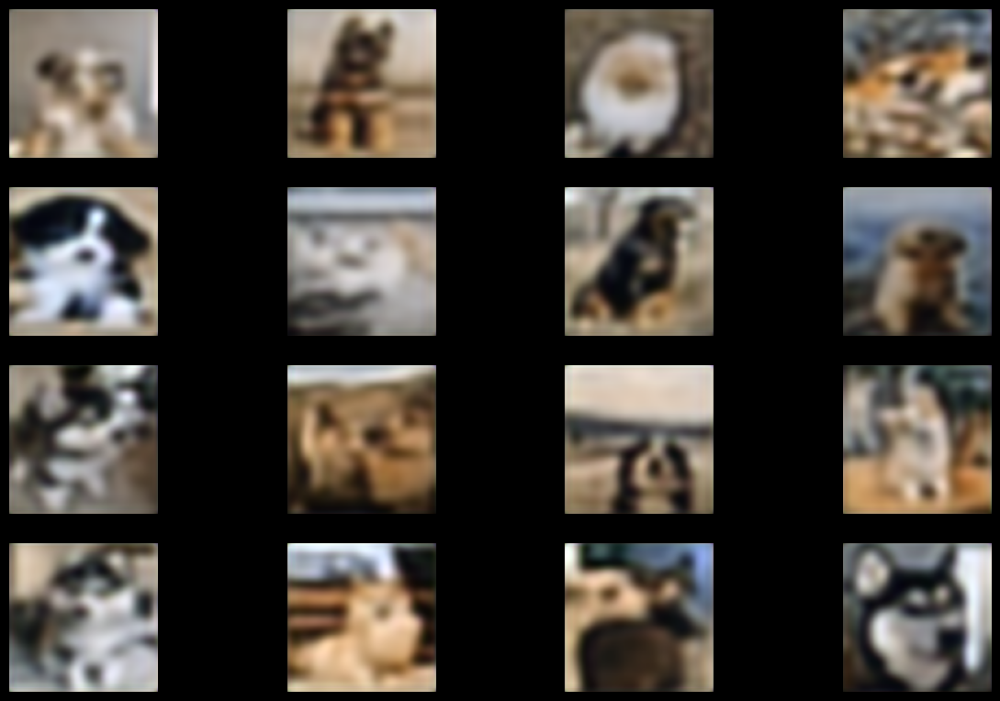

Ground Truth Images:


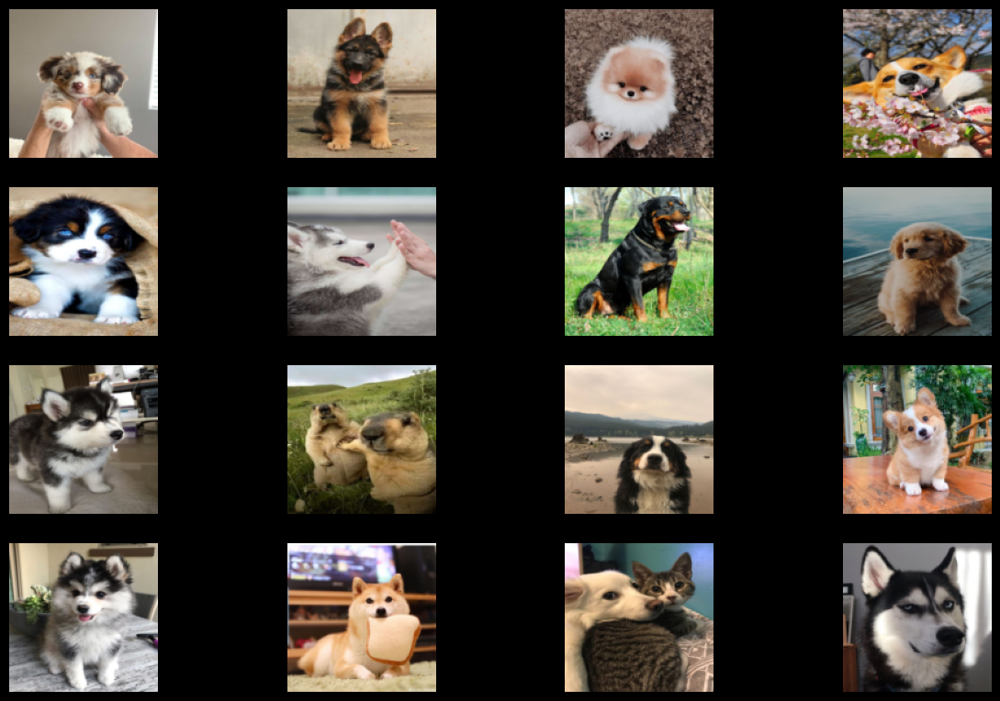

Output min: 0.011547804810106754
Output max: 1.0


In [54]:
### START CODE HERE ###
def imshow_grid(images, nrows=4, ncols=4):
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8, 8))
    fig.set_facecolor('black')
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            img = images[i].permute(1, 2, 0).detach().numpy() 
            img = img * 255 
            ax.imshow(img.astype('uint8'))
        ax.axis('off')
    plt.subplots_adjust(left=0.05, right=1.5, bottom=0.02, top=0.95)
    plt.show()

with torch.no_grad():
    outputs = model(images)

outputs = model(images)
print(f"Output min without Sigmoid: {outputs.min().item()}")
print(f"Output max without Sigmoid: {outputs.max().item()}")

outputs = torch.clamp(outputs, 0, 1).cpu()

print("Output min:", outputs.min().item())
print("Output max:", outputs.max().item())
print("Output values:", outputs[0].cpu().detach().numpy())

print("Input Images:")
imshow_grid(images)

print("Output Images (Reconstructed):")
imshow_grid(outputs)

print("Ground Truth Images:")
imshow_grid(gt)
### END CODE HERE ###

## Explore feature map
Use the `FeatureExtractor()` class and `visualize_feature_map()` function to visualize the feature map of ***ALL*** layers or block of your model. Then, save it as an image.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

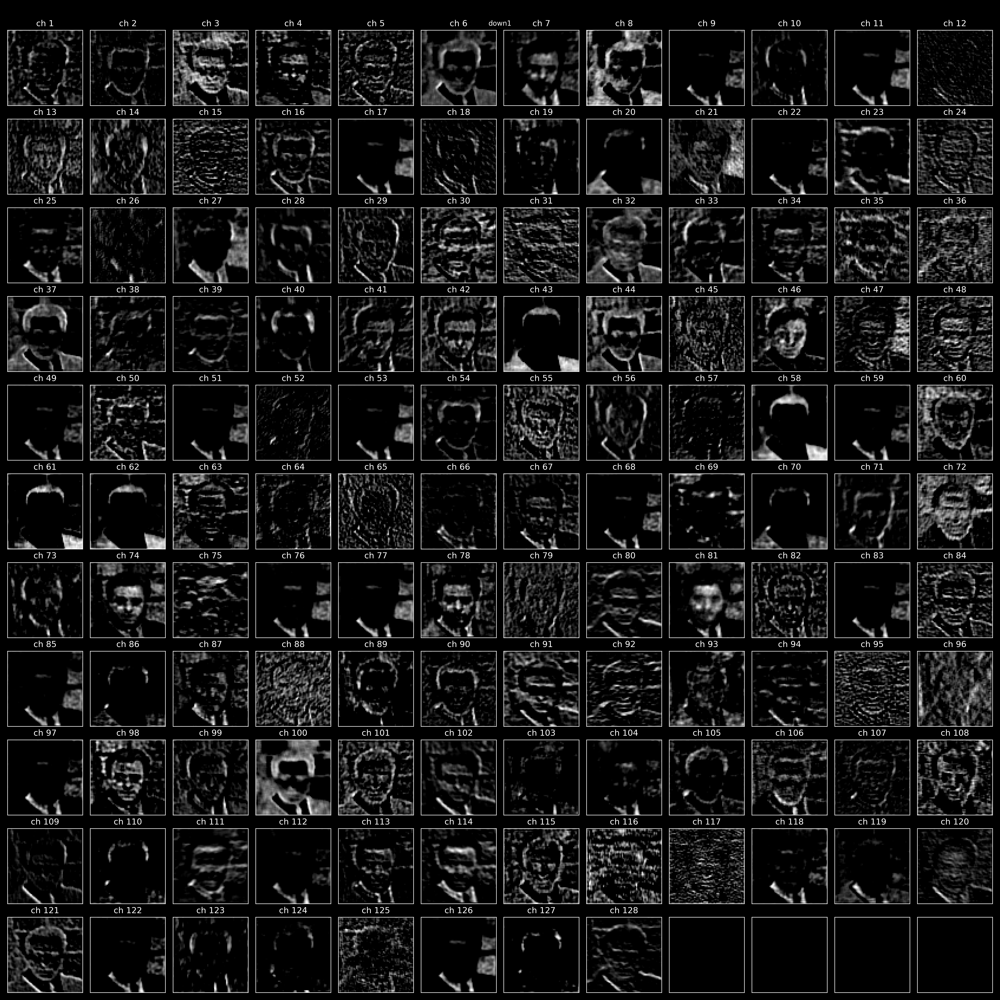
</details>

In [64]:
class FeatureExtractor(nn.Module):
    def __init__(self, model, target_layers):
        super(FeatureExtractor, self).__init__()
        self.model = copy.deepcopy(model)
        self.target_layers = target_layers
        self.features = []

        for layer_name, layer in self.model.named_modules():
            if layer_name in target_layers:
                layer.register_forward_hook(self.save_feature(layer_name))

    def save_feature(self, layer_name):
        def hook(module, input, output):
            self.features.append(output)
        return hook

    def forward(self, x):
        self.features = []
        self.model(x)
        return self.features

In [96]:
### START CODE HERE ###
class VisualizeFeatureMap:
    def __init__(self, model, target_layers):
        self.model = model
        self.target_layers = target_layers
        self.feature_extractor = FeatureExtractor(model, target_layers)
    
    def extract_features(self, images):
        self.features = self.feature_extractor(images)
        return self.features
    
    def plot_features(self, max_channels=64, cmap='gray'):
        for fmap in self.features:
            fmap = fmap.detach().cpu().numpy() 
            num_feature_maps = fmap.shape[1] 
            print(fmap.shape) 
            
            fig, axes = plt.subplots(8, 8, figsize=(30, 30))
            fig.set_facecolor('black')
            axes = axes.flatten()
            
            for i in range(min(num_feature_maps, max_channels)):
                axes[i].imshow(fmap[0, i, :, :], cmap=cmap) 
                axes[i].axis('off')
                axes[i].set_title(f'ch {i+1}', fontsize=16, color='white') 
                
                for spine in ['top', 'bottom', 'left', 'right']:
                    axes[i].spines[spine].set_visible(True)
                    axes[i].spines[spine].set_color('white')
                    axes[i].spines[spine].set_linewidth(1.5)

            for i in range(min(num_feature_maps, max_channels), len(axes)):
                axes[i].axis('off')

            plt.subplots_adjust(wspace=0.1, hspace=0.1)  
            plt.show()
### END CODE HERE ###


(7, 128, 64, 64)


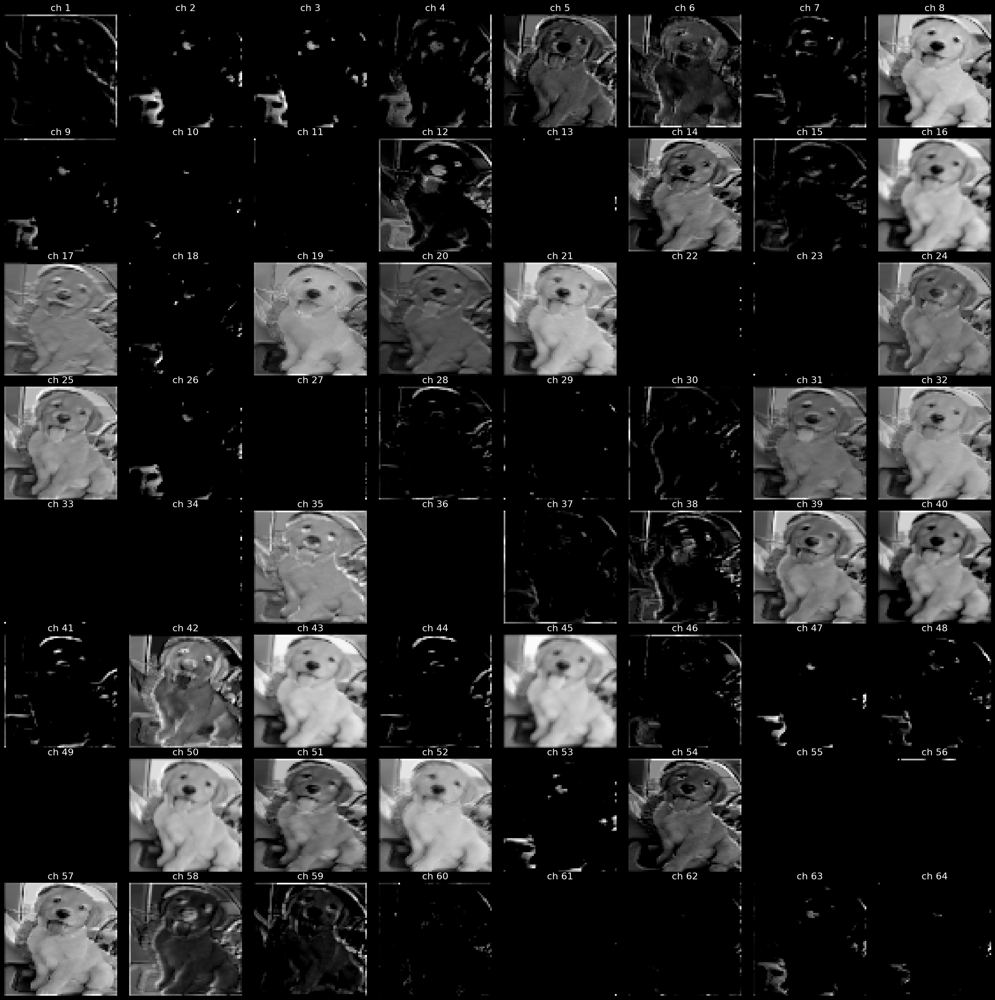

(7, 256, 32, 32)


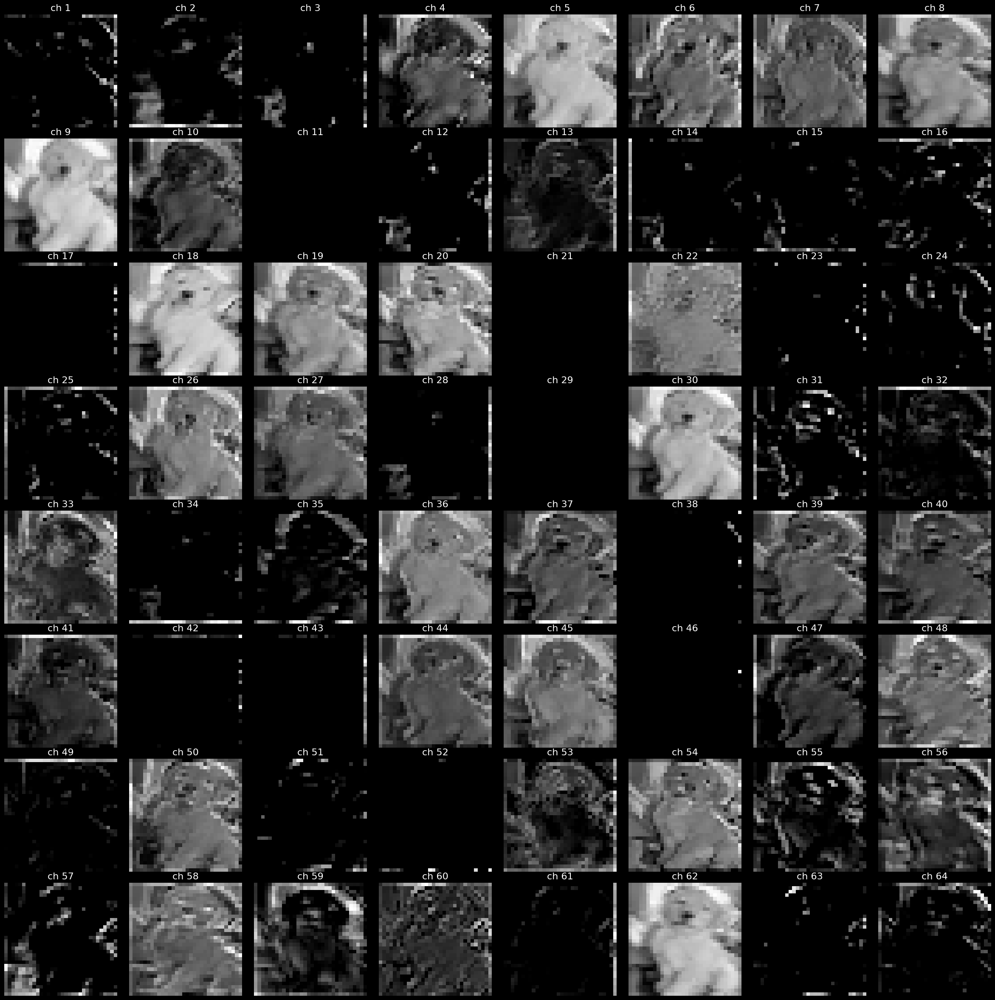

(7, 512, 16, 16)


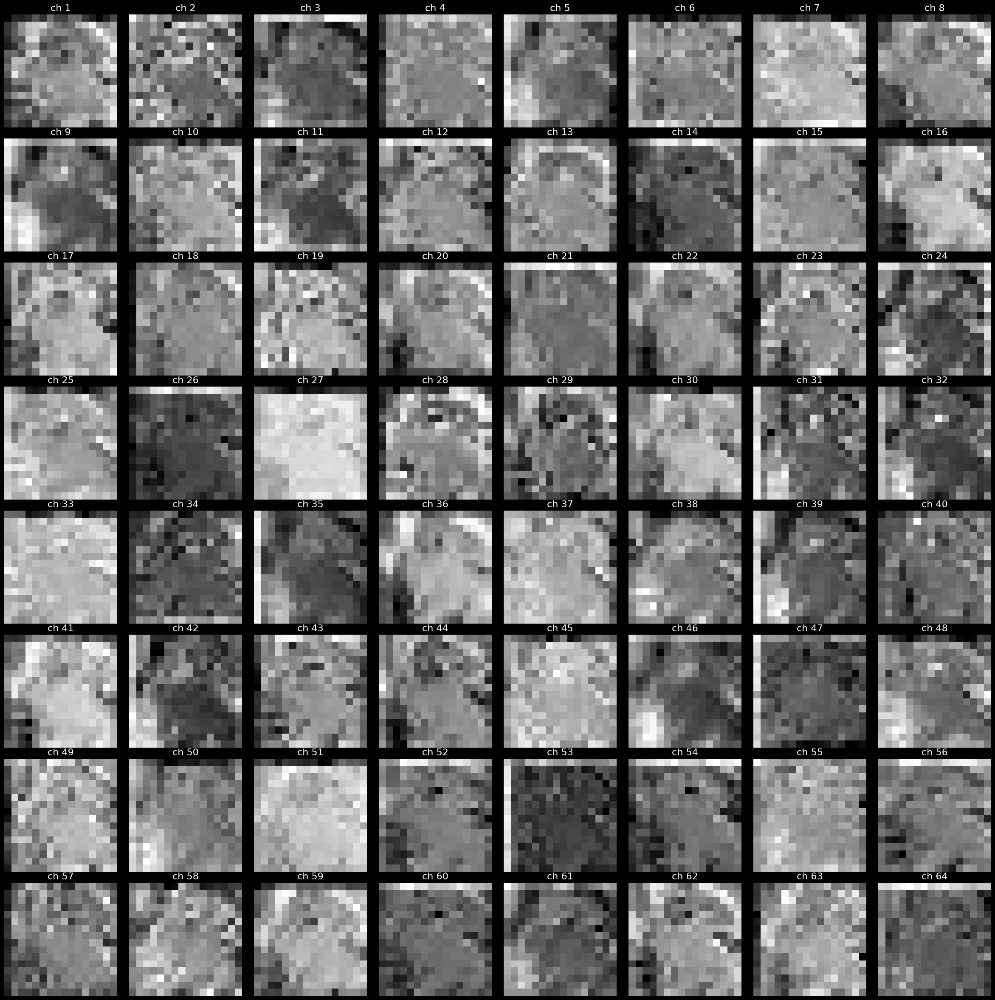

In [97]:
### START CODE HERE ###
model = Autoencoder()
target_layers = ['down1', 'down2', 'bottleneck'] 
visualizer = VisualizeFeatureMap(model, target_layers)

images, _ = next(iter(testloader)) 
images = images.to('cuda' if torch.cuda.is_available() else 'cpu')

visualizer.extract_features(images)

visualizer.plot_features(max_channels=64)
### END CODE HERE ###

---

# Questions:
1. Explain how changing the number of layers and the number of nodes in a Convolutional Neural Network (CNN) affects its performance (model accuracy, training time, and generalization/overfitting?  
2. Explain a comparison of PSNR and SSIM values (objective measurment) to your eye perception (subjective measurement) and suggest the criteria for High, Medium, Low image quality.
3. Explain a comparison of the autoencoder results between training without/with augmentation by visualizing feature maps at each layer.
4. Ranking the autoencoder performance in terms of PSNR and SSIM for each augmentation technique. Which augmentation techiques are mostly affect the autoencoder performance and must introduce to the training?
5. If a flatten layer is added after the last downsampling block to create the latent code (1D) and a dense layer ((linear + activation node)+ reshape back to the feature map size of input of the first upsampling block ) is added at the first layer of decoder before the first upsampling block. Explain a comparison of autoencoder results between 2D vs 1D latent and how feature map of each decoder block changes?
6. Explain the effect of reduced latent code from 2D to 1D.

## 1. เพิ่ม Layers และ Node = โมเดลแม่นยำขึ้น แต่ฝึกนานขึ้น และเสี่ยง Overfitting

### --------------------------------------------------------------------------------------------------------------------------------------------

## 2. PSNR, SSIM สูง = ภาพคุณภาพดี แต่ SSIM สะท้อนการมองเห็นได้ดีกว่า
### -> คุณภาพของ image สูง (PSNR > 40, SSIM > 0.95), กลาง, ต่ำ

### --------------------------------------------------------------------------------------------------------------------------------------------

## 3. ฝึกด้วยการขยายข้อมูล  (Increase dataset Range)
### -> โมเดลจับลักษณะภาพได้ดีขึ้น ลด Overfitting

### --------------------------------------------------------------------------------------------------------------------------------------------

## 4.ขยายข้อมูลที่รักษาโครงสร้าง = โมเดลดีขึ้น เช่น การพลิกภาพ, การหมุน
### -> เทคนิคที่เพิ่มความหลากหลาย เช่น การยืดภาพ = ส่งผลดี

### --------------------------------------------------------------------------------------------------------------------------------------------

## 5. การใช้ latent 1D vs 2D
   ### Latent 1D = โมเดลเล็กลง แต่รายละเอียดอาจลดลง
   ### Latent 2D = โมเดลมีความละเอียดและคุณภาพภาพดีกว่า

### --------------------------------------------------------------------------------------------------------------------------------------------

## 6. ผลกระทบจากการลด latent 2D เป็น 1D
### Latent 1D = โมเดลเล็กลง ประมวลผลเร็วขึ้น แต่คุณภาพอาจลดลง

### --------------------------------------------------------------------------------------------------------------------------------------------